In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
  
%matplotlib inline

import seaborn as sns
import datetime
import warnings
from matplotlib import pyplot as plt
import numpy as np
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")

import pycountry
import plotly.express as px
import pandas as pd

#### Loading the dataset

In [82]:

df = pd.read_excel('Covid-19 vaccinations-by-manufacturer-Efficacy included- DSE2700.xlsx',skiprows=1,sheet_name='vaccinations-by-manufacturer-up')

In [83]:
df.head()

,Country,Date,Vaccine_Manufacturer,Total_Vaccinations,Severe Disease,Infection,Severe Disease.1,Infection.1,Severe Disease.2,Infection.2,Severe Disease.3,Infection.3,Severe Disease.4,Infection.4,Severe Disease.5,Infection.5
0,Argentina,2020-12-29,Oxford/AstraZeneca,1,0.94,0.63,0.94,0.63,0.94,0.69,0.94,0.69,0.94,0.69,0.71,0.36
1,Argentina,2020-12-29,Sinopharm/Beijing,1,0.73,0.68,0.73,0.68,0.71,0.67,0.71,0.67,0.71,0.67,0.53,0.35
2,Argentina,2020-12-29,Sputnik V,20488,18848.96,17619.68,18848.96,17619.68,18234.32,17414.80,18234.32,17414.80,18234.32,17414.80,11268.40,7375.68
3,Argentina,2020-12-30,Sputnik V,40590,37342.80,34907.40,37342.80,34907.40,36125.10,34501.50,36125.10,34501.50,36125.10,34501.50,22324.50,14612.40
4,Argentina,2020-12-31,Sputnik V,43396,39924.32,37320.56,39924.32,37320.56,38622.44,36886.60,38622.44,36886.60,38622.44,36886.60,23867.80,15622.56


#### Dropping the Ancestral,Gamma & Delta 

In [84]:
df.drop(columns=['Severe Disease', 'Infection', 'Severe Disease.3', 'Infection.3',
       'Severe Disease.4', 'Infection.4'], inplace=True, axis=1)

#### Printing the columns names

In [85]:
df.columns

Index(['Country', 'Date', 'Vaccine_Manufacturer', 'Total_Vaccinations',
       'Severe Disease.1', 'Infection.1', 'Severe Disease.2', 'Infection.2',
       'Severe Disease.5', 'Infection.5'],
      dtype='object')

#### Renaming columns names

In [86]:
df.rename({'Severe Disease.1': 'alpha_severe', 'Infection.1': 'alpha_infection',
                'Severe Disease.2': 'beta_severe'  , 'Infection.2': 'beta_infection',
                'Severe Disease.5':'omicron_severe', 'Infection.5':'omicron_infection'}, axis=1, inplace=True)  # new method     

#### Changing datatype of columns from float to Integers

In [87]:
#Change the data type of features
df.alpha_severe = df.alpha_severe.astype(int)
df.alpha_infection = df.alpha_infection.astype(int)
df.beta_severe = df.beta_severe.astype(int)
df.beta_infection = df.beta_infection.astype(int)
df.omicron_severe = df.omicron_severe.astype(int)
df.omicron_infection =df.omicron_infection.astype(int)

#### Dropping NA values if any exists

In [88]:
# Counting missing value
df.isnull().sum()


Country                 0
Date                    0
Vaccine_Manufacturer    0
Total_Vaccinations      0
alpha_severe            0
alpha_infection         0
beta_severe             0
beta_infection          0
omicron_severe          0
omicron_infection       0
dtype: int64

In [89]:
df.dropna(inplace=True)

In [90]:
df['Vaccine_Manufacturer'].unique()

array(['Oxford/AstraZeneca', 'Sinopharm/Beijing', 'Sputnik V',
       'Pfizer/BioNTech', 'CanSino', 'Moderna', 'Johnson&Johnson',
       'Novavax', 'Valneva', 'Medicago', 'Sinovac', 'Covaxin',
       'SKYCovione'], dtype=object)

In [91]:
#dropping european Union
df = df[df.Country != 'European Union']

In [92]:
df.shape

(41550, 10)

In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41550 entries, 0 to 41549
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Country               41550 non-null  object        
 1   Date                  41550 non-null  datetime64[ns]
 2   Vaccine_Manufacturer  41550 non-null  object        
 3   Total_Vaccinations    41550 non-null  int64         
 4   alpha_severe          41550 non-null  int32         
 5   alpha_infection       41550 non-null  int32         
 6   beta_severe           41550 non-null  int32         
 7   beta_infection        41550 non-null  int32         
 8   omicron_severe        41550 non-null  int32         
 9   omicron_infection     41550 non-null  int32         
dtypes: datetime64[ns](1), int32(6), int64(1), object(2)
memory usage: 2.5+ MB


In [94]:
df.groupby('Vaccine_Manufacturer').sum()

,Total_Vaccinations,alpha_severe,alpha_infection,beta_severe,beta_infection,omicron_severe,omicron_infection
Vaccine_Manufacturer,,,,,,,
CanSino,290458393,191702258,180083906,185893102,177179325,139419750,92946403
Covaxin,1540,1177,1102,1151,1089,856,565
Johnson&Johnson,12897033080,11091445296,9285860738,9801742059,8254098171,7351305687,4256017805
Medicago,3098,2756,2322,2756,2322,2011,1330
Moderna,149725260531,145233498280,137747235393,145233498280,136249982652,109299435728,71868120777
Novavax,183696025,163488528,152466761,157977676,150629806,119401530,78988378
Oxford/AstraZeneca,33507450352,31496999950,21109690281,31496999950,23120137300,23790286311,12062678796
Pfizer/BioNTech,440160809216,418152763058,378538290055,418152763058,369735073963,316915776879,193670750278
SKYCovione,12423,6502,6069,9053,8555,6817,4455


In [95]:
total_vac = df.groupby(['Vaccine_Manufacturer','Country']).sum()
total_vac.columns
count_total_vac = total_vac.reset_index()
fig = px.bar(count_total_vac, x="Country", y="Total_Vaccinations", color="Vaccine_Manufacturer", title="Total Vaccination With Respect to Country and Manufacturer")
fig.show()

In [96]:
Vaccine_Manufacturer =df.groupby("Vaccine_Manufacturer")["Country"].nunique()
Country_wise_count = Vaccine_Manufacturer.to_frame().reset_index()

In [97]:
import plotly.express as px
fig = px.bar(Country_wise_count, y='Country', x='Vaccine_Manufacturer',  title="Vaccine Manufacturer Count -Country Wise")
fig.show()


In [98]:
df1_grouped = df.groupby('Vaccine_Manufacturer')
for group_name, df_group in df1_grouped:
    vaccine_group = df1_grouped.get_group(group_name)
    
    list_countries = vaccine_group['Country'].unique().tolist()
    country_cnt = len(vaccine_group['Country'].unique())
    d_country_code = {}
    for country in list_countries:
        try:
            country_data = pycountry.countries.search_fuzzy(country)
            country_code = country_data[0].alpha_3
            d_country_code.update({country: country_code})
        except:
            print('could not add ISO 3 code for ->', country)
            d_country_code.update({country: ' '})

    for k, v in d_country_code.items():
        vaccine_group.loc[(vaccine_group.Country == k), 'iso_alpha'] = v
        
    fig = make_subplots(rows=3, cols=4, start_cell="bottom-left")

        
    fig = px.choropleth(data_frame = vaccine_group,
                    locations= "iso_alpha",
                    color= "Country",
                    color_continuous_scale= px.colors.sequential.Inferno,
                    hover_name= "Vaccine_Manufacturer")
    fig.update_layout(
        title_text = "Countries {}".format(country_cnt))


    fig.show()

### Tree Map

In [99]:
vaccine_count = df.groupby("Vaccine_Manufacturer")["Country"].nunique()
Vaccine_Manufacturer_count = pd.DataFrame({'Vaccine_Manufacturer':vaccine_count.index, 'Count':vaccine_count.values})

In [100]:
import plotly.express as px
fig = px.treemap(
    Vaccine_Manufacturer_count, path = ["Vaccine_Manufacturer", "Count"], values = "Count")
fig.update_traces(root_color="royalblue")
fig.show()


In [101]:
total = df.groupby(['Country','Vaccine_Manufacturer'])["Total_Vaccinations"].sum().rename("Total_sum").reset_index()
df_1 = df.merge(total)
gk_1 = df_1.groupby('Vaccine_Manufacturer')
for group_name, df_group in df1_grouped:
    Oxford = gk_1.get_group(group_name)
    print(group_name)
# total.Vaccine_Manufacturer

CanSino
Covaxin
Johnson&Johnson
Medicago
Moderna
Novavax
Oxford/AstraZeneca
Pfizer/BioNTech
SKYCovione
Sinopharm/Beijing
Sinovac
Sputnik V
Valneva


In [102]:
# plotting a pie plot for diffrent kind of vaccines
def plot_pie(value, title, color) : 
    new_dict = {}
    for v in df[value].unique() : 
        value_count = 0
        for i in range(len(df)) : 
            if df[value][i] == v : 
                value_count += 1 
        new_dict[v] = value_count 
#     print(new_dict)
    new_df = pd.DataFrame.from_dict(new_dict, orient = 'index', columns = ['Total'])
    if color == 'plasma' : 
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title,
                     color_discrete_sequence=px.colors.sequential.Plasma)
    elif color == 'rainbow' : 
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title,
                     color_discrete_sequence=px.colors.sequential.Rainbow)
    else :
        fig = px.pie(new_df, values= 'Total',
                     names = new_df.index,
                     title = title)
    fig.update_layout(
        title={
            'y':0.95,
            'x':0.5
        },
        legend_title = value
    )
    return fig.show()
    
plot_pie('Vaccine_Manufacturer', 'Various vaccines and their uses', 'plasma')

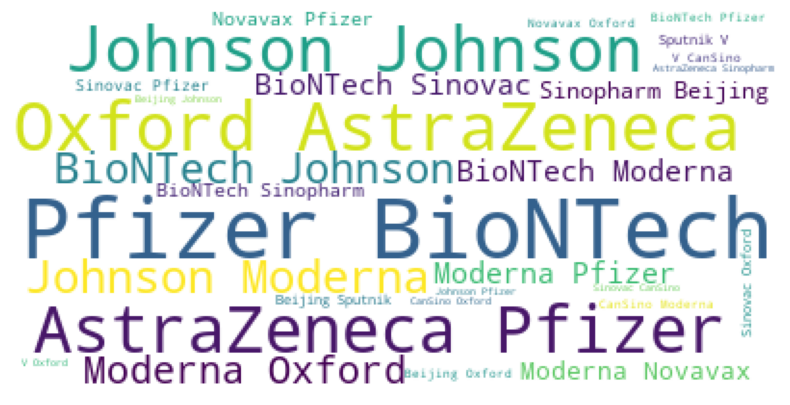

In [103]:
# Word art of vaccines
from wordcloud import WordCloud
wordCloud = WordCloud(
    background_color='white',
    max_font_size = 50).generate(' '.join(df.Vaccine_Manufacturer))
plt.figure(figsize=(12,5))
plt.axis('off')
plt.imshow(wordCloud)
plt.show()

### Bubble Chart For Vaccine

In [104]:
total = df.groupby(['Country','Vaccine_Manufacturer'])["Total_Vaccinations"].sum().rename("Total_sum").reset_index()
df_1 = df.merge(total)
gk_1 = df_1.groupby('Vaccine_Manufacturer')
for group_name, df_group in df1_grouped:
    
    Oxford = gk_1.get_group(group_name)
    fig = px.scatter(Oxford, x = 'Country', y = 'Total_sum', size = 'Total_sum', color = "Country",
                hover_name="Vaccine_Manufacturer",size_max=70, title="Vaccine- "+group_name)

    fig.show()


In [105]:
df.columns

Index(['Country', 'Date', 'Vaccine_Manufacturer', 'Total_Vaccinations',
       'alpha_severe', 'alpha_infection', 'beta_severe', 'beta_infection',
       'omicron_severe', 'omicron_infection'],
      dtype='object')

In [106]:
total = df.groupby(['Country','Vaccine_Manufacturer'])["alpha_severe"].sum().rename("alpha_severe").reset_index()
total.columns

Index(['Country', 'Vaccine_Manufacturer', 'alpha_severe'], dtype='object')

In [107]:
total = df.groupby(['Country','Vaccine_Manufacturer'])['alpha_severe','alpha_infection','beta_severe', 'beta_infection',
       'omicron_severe', 'omicron_infection'].sum()

#### Scatter Plot

In [108]:
for col in df.columns[4:]:
    total = df.groupby(['Country','Vaccine_Manufacturer'])[col].sum().rename(col).reset_index()
    fig = px.scatter(total, x="Country", y=col, color='Vaccine_Manufacturer', size=col, hover_data=['Vaccine_Manufacturer'], title=col)
    fig.show()

In [109]:
fig = px.line (data_frame = df, x = df.index, y = 'Total_Vaccinations', color = 'Country', 
               color_discrete_sequence=px.colors.qualitative.Plotly, line_dash = 'Country', 
               labels = {'Vaccination': 'Total_Vaccinations', 'date':'Date'}, title = 'Covid Vaccination')

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_traces(hovertemplate=None)
fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                  hovermode="x unified", 
                  xaxis_title=' ', yaxis_title=" ",
                  plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                  title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'))
fig.show()

In [110]:
#Evolution of the vccination around the months, by country.
fig = px.density_heatmap(df, y='Country', x='Date', z='Total_Vaccinations',
                         title='Total vaccination')
fig.update_yaxes(showgrid=False, categoryorder='total ascending', ticksuffix=' ', showline=False)
fig.update_layout(xaxis_title=' ', yaxis_title=" ",
                  plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                  title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'))
fig.show()

In [111]:
# total vaccination USA vs Canada
canada_usa = [df[df.Country == 'United States'], df[df.Country == 'Canada']]
result = pd.concat(canada_usa)
fig = px.line(result, x = 'Date', y ='Total_Vaccinations', color = 'Country')
fig.update_layout(
    title={
            'text' : "Total vaccinated - Canada vs USA",
            'y':0.95,
            'x':0.5
        },
    xaxis_title="Date",
    yaxis_title="Total Vaccinations"
)
fig.show()

In [112]:
df['year'] = df['Date'].dt.year

In [113]:
# a=df.groupby('Country')['year']
# pd.DataFrame(a)
df3=pd.DataFrame(df.groupby(['Country','Vaccine_Manufacturer','year'])["Total_Vaccinations"].sum().rename("Total_sum").reset_index())

In [116]:
df1=df.copy()

In [203]:
df= df1.copy()

In [115]:
# df['Total_Vaccination_Country_Wise']= np.nan

In [80]:
# a= df.groupby(['Country','Vaccine_Manufacturer'])['Total_Vaccinations'].transform(max) == df['Total_Vaccination_Country_Wise']
# df1= df[a]
# df1

In [204]:
#Taking Max count of each vaccine manufacturer
df['Vaccine_Wise_Max_Total_Vaccination']=df.groupby(['Country','Vaccine_Manufacturer'])['Total_Vaccinations'].transform(max)


In [205]:
# df.groupby(['Country','Vaccine_Manufacturer'])['Vaccine_Wise_Max_Total_Vaccination'].transform('sum')


In [206]:
# df[df['Country']=='Argentina']

In [207]:
# df['Country_Total_Vaccination']=df.groupby(['Country','Vaccine_Manufacturer'])['Vaccine_Wise_Max_Total_Vaccination'].sum()
# df['Country_Total_Vaccination'] = df.groupby(['Country'])['Vaccine_Wise_Max_Total_Vaccination'].transform('sum')


In [208]:
# #  df['Total_Vaccination_Country_Wise']= df.groupby(['Country'])['Total_Vaccinations'].transform('sum')
# l1= list(df['Country'].unique())
# for i in l1:
#     print(sum(list(df[df['Country']==i]['Vaccine_Wise_Max_Total_Vaccination'].unique())))


In [209]:
# sum(list(df[df['Country']=='Uruguay']['Vaccine_Wise_Max_Total_Vaccination'].unique()))



In [215]:
# df['Total_Vaccination_Country_Wise']= df.groupby(['Country','Vaccine_Manufacturer'])['Vaccine_Wise_Max_Total_Vaccination'].transform('sum')df.loc

l1= list(df['Country'].unique())
for i in l1:

    df.loc[df['Country']==i, 'Total_Vaccination_Country_Wise'] = sum(list(df[df['Country']== i]['Vaccine_Wise_Max_Total_Vaccination'].unique()))

In [221]:
df['Percentage_of_Vaccine'] =df['Vaccine_Wise_Max_Total_Vaccination']/df['Total_Vaccination_Country_Wise']

In [222]:
df

,Country,Date,Vaccine_Manufacturer,Total_Vaccinations,alpha_severe,alpha_infection,beta_severe,beta_infection,omicron_severe,omicron_infection,year,Vaccine_Wise_Max_Total_Vaccination,Total_Vaccination_Country_Wise,Percentage_of_Vaccine
0,Argentina,2020-12-29,Oxford/AstraZeneca,1,0,0,0,0,0,0,2020,26759220,109748183.0,0.243824
1,Argentina,2020-12-29,Sinopharm/Beijing,1,0,0,0,0,0,0,2020,28878166,109748183.0,0.263131
2,Argentina,2020-12-29,Sputnik V,20488,18848,17619,18234,17414,11268,7375,2020,20742641,109748183.0,0.189002
3,Argentina,2020-12-30,Sputnik V,40590,37342,34907,36125,34501,22324,14612,2020,20742641,109748183.0,0.189002
4,Argentina,2020-12-31,Sputnik V,43396,39924,37320,38622,36886,23867,15622,2020,20742641,109748183.0,0.189002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41545,Uruguay,2022-10-12,Pfizer/BioNTech,2556144,2428336,2198283,2428336,2147160,1840423,1124703,2022,2556226,5895528.0,0.433587
41546,Uruguay,2022-10-13,Pfizer/BioNTech,2556166,2428357,2198302,2428357,2147179,1840439,1124713,2022,2556226,5895528.0,0.433587
41547,Uruguay,2022-10-14,Pfizer/BioNTech,2556194,2428384,2198326,2428384,2147202,1840459,1124725,2022,2556226,5895528.0,0.433587
41548,Uruguay,2022-10-15,Pfizer/BioNTech,2556197,2428387,2198329,2428387,2147205,1840461,1124726,2022,2556226,5895528.0,0.433587


In [ ]:
l1= list(df['Country'].unique())
for i in l1:

    df.loc[df['Country']==i, 'Total_Vaccination_Country_Wise'] = sum(list(df[df['Country']== i]['Vaccine_Wise_Max_Total_Vaccination'].unique()))

In [226]:
# l1= list(df['Country'].unique())
# for i in l1:
#     print(sum(list(df[df['Country']== i]['Percentage_of_Vaccine'].unique())))